# Table Of Content
<a id='data_analysis'></a>
#### [1.PreProcessing](#PreProcessing)
#### [2.Linear Analysis](#Stats.Model)
#### [3.Linear Analysis](#Stats.Model)

In [328]:
from random import gauss as gs
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 110)
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import TimeSeriesSplit
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestRegressor 
from sklearn.model_selection import GridSearchCV


import itertools
from pmdarima import auto_arima
import plotly.graph_objects as go
import statsmodels.api as sm

#statsmodels
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import acf, pacf, adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import STL
from sklearn.base import BaseEstimator, TransformerMixin
from sktime.forecasting.naive import NaiveForecaster
from keras.models import Sequential 
from keras.layers import LSTM, Dense 
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [62]:
# !pip install sktime
# !pip install pmdarima

In [63]:
df = pd.read_csv('SDGE_W.csv')

In [64]:
# Dropping unnecessary columns and setting date as index
df = df.drop('Unnamed: 0', axis=1)
df.set_index("Date", inplace =True)
df.index = pd.to_datetime(df.index)

In [65]:
df.head()

,SDGE,year,month,day,hour,weekday,season,holiday,HourlyDryBulbTemperature,HourlyRelativeHumidity,HourlyWindSpeed
Date,,,,,,,,,,,
2019-01-01 00:00:00,2372.497411,2019,1,1,0,Tuesday,winter,1,49.0,71.0,0.0
2019-01-01 01:00:00,2698.751137,2019,1,1,1,Tuesday,winter,0,47.0,77.0,5.0
2019-01-01 02:00:00,2777.672120,2019,1,1,2,Tuesday,winter,0,47.0,63.0,6.0
2019-01-01 03:00:00,2799.193829,2019,1,1,3,Tuesday,winter,0,47.0,52.0,6.0
2019-01-01 04:00:00,2761.883322,2019,1,1,4,Tuesday,winter,0,46.5,51.5,5.5


In [66]:
def train_val_test_split(df, validation=True):
    train_end = '2022-03-14 18:00:00'

    train_val = df.loc[:train_end, :]
    test_df = df.loc[train_end:, :]

    if not validation:
        return train_val, test_df

    n = len(train_val)
    cutoff = int(n*0.8)

    train_df = train_val[:cutoff]
    val_df = train_val[cutoff:]
    return train_df, val_df, test_df

In [67]:
def error_metrics(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = mean_squared_error(y_true, y_pred, squared=False)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    variance_score = r2_score(y_true, y_pred)
    print(f"Mean Absolute Error: {mae:.2f}")
    print(f"Mean Squared Error: {mse:.2f}")
    print(f"Root Mean Squared Error: {rmse:.2f}")
    print(f"Mean Absolute Percentage Error: {mape:.2f}%")
    print(f"Variance Score: {variance_score:.2f}")

In [407]:
def plot_ts_pred(og_ts, pred_ts, model_name=None, og_ts_opacity = 0.5, pred_ts_opacity = 0.5):

    fig = go.Figure()

    fig.add_trace(go.Scatter(x = og_ts.index, y = np.array(og_ts.values), name = "Observed",
                         line_color = 'deepskyblue', opacity = og_ts_opacity))

    try:
        fig.add_trace(go.Scatter(x = pred_ts.index, y = pred_ts, name = model_name,
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))
    except: #if predicted values are a numpy array they won't have an index
        fig.add_trace(go.Scatter(x = og_ts.index, y = pred_ts, name = model_name,
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))


    #fig.add_trace(go)
    fig.update_layout(title_text = 'Actual vs Predicted energy MWH using {}'.format(model_name),
                  xaxis_rangeslider_visible = True)
    fig.show()

In [69]:
def record_results(model_name, train_results, test_results):     
    new_row = {         
        'Model': model_name,         
        'Mean Absolute Error': train_results['Mean Absolute Error'],         
        'Mean Squared Error': train_results['Mean Squared Error'],         
        'Root Mean Squared Error': train_results['Root Mean Squared Error'],         
        'Mean Absolute Percentage Error': train_results['Mean Absolute Percentage Error'],         
        'Variance Score': train_results['Variance Score']    
    }     
    new_row_df = pd.DataFrame(new_row, index=[0])     
    model_df = pd.concat([model_df, new_row_df], ignore_index=True)     
    return model_df 

# PreProcessing
>- Data has categorical and continuous features
>- We'll use the processor below for appropriate models that need preprocessing

In [117]:
cat_cols = ['year', 'month', 'day', 'hour', 'weekday', 'season', 'holiday']
num_cols = ['HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlyWindSpeed'] 

In [118]:
categorical_transformer = Pipeline(steps=[
    ('encoder', OneHotEncoder(sparse=False, handle_unknown='ignore'))
    
])
# Since we can't impute with mean we're using the constant imputing strategy to bfill, and the fill_value ensuring missing values are
#imputed with the next available value
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(add_indicator=True, strategy='constant', fill_value=None)),
    ('scaler', StandardScaler())
])

In [119]:
processes = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, cat_cols),
        ('num', numerical_transformer, num_cols)
    ], remainder='passthrough')

In [151]:
processes_num = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, num_cols)
    ], remainder='passthrough')

# Stats.Model
>- We'll check the goodness of fit with feature engineered columns from date_index and weather data
### Evaluation
>- The R-squared value 0.604, means that approximately 60.4% of the variation in the dependent variable, SDGE (energy consuption of Sandiego) can be explained by the independent variables in the model.
>- The adjusted R-squared value is 0.603, which takes into account the number of independent variables in the model. It is slightly lower than the R-squared value, suggesting that the additional independent variables may not be contributing much to the model's explanatory power.
>- The associated p-value is 0.00, indicating that the model is statistically significant.

In [73]:
# Checking linear regression fit using statsmodels Linear regression
from statsmodels.formula.api import ols
m = ols('SDGE ~  C(year) + C(month) + C(day) +C(hour) + C(weekday) + C(season) + C(holiday) + \
                 HourlyDryBulbTemperature + HourlyRelativeHumidity + HourlyWindSpeed', df).fit()
print(m.summary())

                            OLS Regression Results                            
Dep. Variable:                   SDGE   R-squared:                       0.604
Model:                            OLS   Adj. R-squared:                  0.603
Method:                 Least Squares   F-statistic:                     693.3
Date:                Sat, 11 Nov 2023   Prob (F-statistic):               0.00
Time:                        14:55:41   Log-Likelihood:            -2.4719e+05
No. Observations:               35064   AIC:                         4.945e+05
Df Residuals:                   34986   BIC:                         4.952e+05
Df Model:                          77                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept               

# Baseline Model 
## Persistent Forcast 
Time series models are different from other continuous models because they take into account the temporal nature of the data. In time series analysis, the order and timing of the observations are important, and the goal is often to forecast future values based on past observations.

One key aspect of time series analysis is the consideration of time lags. Time lags refer to the use of previous observations as predictors for forecasting future values. By including lagged values as predictors we can capture the temporal dependencies and patterns in the data.

The persistent_forecast simple model below is created using time lags. It uses the np.tile() function to repeat the last 8760 values of the train_df['SDGE'] series multiple times, enough to cover the length of the test_df series. This ensures that the persistent_forecast has the same length as the test_df series. The [:len(test_df)] indexing is used to truncate the persistent_forecast to match the length of the test_df series.

By using the last 8760 values of the train_df['SDGE'] series as the persistent forecast, the code assumes that the future values will be similar to the most recent past values. This approach is often used as a simple baseline or benchmark for time series forecasting, where the forecast for each future point is simply the value of the corresponding lagged point.

### Model Results 
Based on MAE on average, the predicted energy consumption values deviate from the true values by approximately 317.36 MW.

The MSE value of 185234.29 represents the average squared difference between the predicted and true energy consumption values. Since MSE is squared, it penalizes larger errors more heavily. In this case, the MSE suggests that the model's predictions have a relatively high level of error. The MSE provides a measure of the average magnitude of the errors in the same unit as the target variable. 

The RMSE indicates that, on average, the predicted energy consumption values deviate from the true values by approximately 430.39 MW.

On average, the predicted values deviate from the true values by approximately 14.07%.

The variance score, also known as the coefficient of determination, measures the proportion of the variance in the target variable that can be explained by the model. A variance score of 0.29 indicates that the model explains approximately 29% of the variance in the energy consumption values. This suggests that there may be other factors or variables that are not captured by the model.

* Using this as a baseline i'll be opting to improve model performance

In [74]:
df_hr = df[['SDGE']] # Using only target and index since I'll be using just time for the first simple model

In [75]:
train_ts ,test_ts = train_val_test_split(df_hr, validation=False)

In [76]:
# Creates the persistent forecast by repeating the values from last year 
# The code below also repreats multiple times ensuring forcast has the same length as test data
#Finaling slicing the repeated data to match the test
persistent_forecast = np.tile(train_ts['SDGE'].values[-8760:], len(test_ts) // 8760 + 1)[:len(test_ts)]  

In [77]:
# Calculate the errors 
y_true_pf = test_ts['SDGE'] 
y_pred_pf = persistent_forecast
error_metrics(y_true_pf, y_pred_pf) 

Mean Absolute Error: 317.36
Mean Squared Error: 185234.29
Root Mean Squared Error: 430.39
Mean Absolute Percentage Error: 14.07%
Variance Score: 0.29


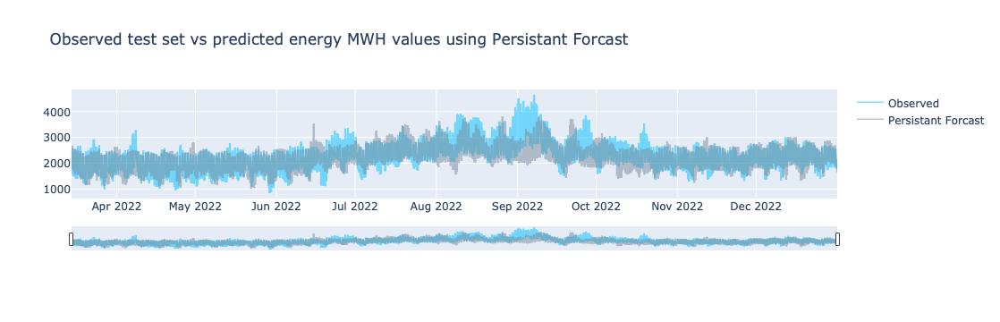

In [78]:
plot_ts_pred(y_true_pf, y_pred_pf, model_name='Persistant Forcast', og_ts_opacity = 0.5, pred_ts_opacity = 0.5)

# Time Series Preprocessing

### Testing for stationarity 
Based on the provided information, the test statistic is -8.697959e+00 and the p-value is 3.878533e-14. 
If the p-value is less than the significance level (commonly 0.05), we reject the null hypothesis 
and conclude that the time series is stationary. 

In this case, the p-value (3.878533e-14) is much smaller than the significance level (0.05), 
indicating strong evidence against the null hypothesis. We can therefore conclude that the time series is stationary.

In [79]:
df_ad = df_hr[['SDGE']]

In [80]:
ts_test = adfuller(df_ad)
display(ts_test)

(-8.69795881318699,
 3.878533167943309e-14,
 52,
 35011,
 {'1%': -3.43053679213716,
  '5%': -2.8616225575095284,
  '10%': -2.566813942767471},
 475245.4656370086)

In [81]:
# Extract and display test results in a user friendly manner
dfoutput = pd.Series(
                ts_test[0:4], 
                index=['Test Statistic','p-value','#Lags Used','Number of Observations Used']
)

for key,value in ts_test[4].items():
    dfoutput['Critical Value (%s)'%key] = value
    
display(dfoutput)

Test Statistic                -8.697959e+00
p-value                        3.878533e-14
#Lags Used                     5.200000e+01
Number of Observations Used    3.501100e+04
Critical Value (1%)           -3.430537e+00
Critical Value (5%)           -2.861623e+00
Critical Value (10%)          -2.566814e+00
dtype: float64

### Exponential Smoothing
Exponential smoothing is a time series forecasting method that assigns exponentially decreasing weights to past observations. 

With an alpha value of 0.5, the model considers the most recent data point to be equally important as the previous forecast in predicting the future values.

The visual predicted values are close to the actual values, suggesting that the exponential smoothing model is capturing the underlying trend or pattern in the data reasonably well, smoothing out the noise or random fluctuations.

However Exponential smoothing is relatively a simple forcasting method and may fail to capture all complexities, we're also using just time as a variable without weather consideration. We'll explore other models to account for seasonality and fluctuations since our data has seasonal fluctuations on weekly and monthly bases.

The visualization was helpful in picking seasonal trends within hourly forcast that the decomposition method wasn't able to pick on.

In [82]:
# Defining a function to plot exponentially smoothed data
def plot_ewma(ts, alpha):
    expw_ma = ts.ewm(alpha=alpha).mean()
    
    plot_ts_pred(ts, expw_ma, model_name='Exponentially smoothed data with alpha = {}'.format(alpha), \
                 og_ts_opacity = 0.5, pred_ts_opacity = 0.5)

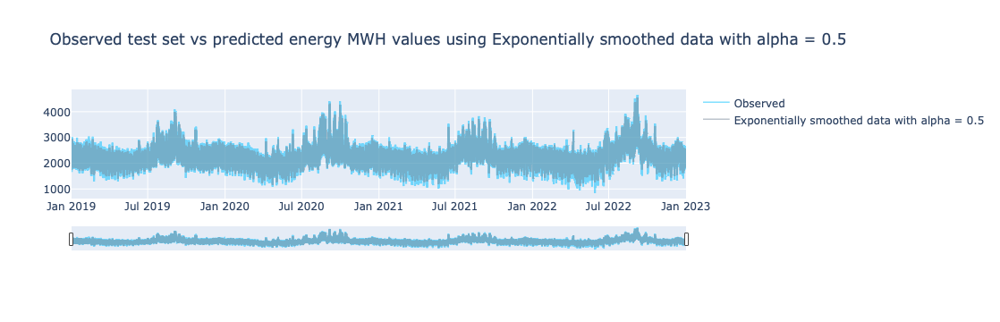

In [83]:
# Plotting the exponentially smoothed energy consumption data with alpha=0.5
plot_ewma(df_hr['SDGE'], 0.5)

### Autocorrelation
Autocorrelation and partial autocorrelation are statistical measures used to analyze the relationship between observations in a time series data.

Autocorrelation (ACF):
Autocorrelation measures the linear relationship between an observation and its lagged values. It helps identify any patterns or dependencies in the data that are related to its past values. The autocorrelation function (ACF) is a plot that shows the correlation coefficient between the observations at different lags.

Interpretation of ACF:
- If the ACF plot shows a significant positive autocorrelation at lag 1, it suggests that the current observation is positively correlated with the previous observation. This indicates a trend or persistence in the data.
- If the ACF plot shows a significant negative autocorrelation at lag 1, it suggests that the current observation is negatively correlated with the previous observation. This indicates a reversal or mean-reversion pattern in the data.
- If the ACF plot shows significant autocorrelation at multiple lags, it suggests the presence of a seasonal or cyclical pattern in the data.

Partial Autocorrelation (PACF):
Partial autocorrelation measures the direct relationship between an observation and its lagged values, while controlling for the intermediate lags. It helps identify the direct influence of past observations on the current observation, without the influence of the intermediate lags.

Interpretation of PACF:
- If the PACF plot shows a significant partial autocorrelation at lag 1 and no significant partial autocorrelation at other lags, it suggests a first-order autoregressive (AR) process. This means that the current observation is directly influenced by the previous observation.
- If the PACF plot shows a significant partial autocorrelation at lag 1 and significant partial autocorrelation at other lags, it suggests a higher-order AR process. This means that the current observation is influenced by multiple past observations.
- If the PACF plot shows significant partial autocorrelation at multiple lags, it suggests the presence of a seasonal or cyclical pattern in the data.

It is important to note that the interpretation of autocorrelation and partial autocorrelation can vary depending on the specific characteristics of the data and the context of the analysis. It is recommended to use these measures in conjunction with other diagnostic tools and statistical tests to gain a comprehensive understanding of the time series data.

#### Interpretation 
As is identified above and further confirmed with these two plots, this time series has multiple seasonality and complex seasonality patterns. For this kind of time series, ARIMA (a common time series model) will not work very well.

Will try to decompose the time series with the STL method. The period is 24 * 7 hours because from the preprocessing in previous notebook weekly seasonality was observed [Notebook](https://github.com/Danayt09/Phase_5_Energy/blob/main/EnergyPreprocessing.ipynb). There are 24 times 7 hours in a week. Of course, there are other seasonalities in this data, but the period mentioned above should demonstrate well this decomposition. And since this project is for energy trading purposes forcasts are usefull at longet a week in advance becdause of storage limitations and the fliuctuating nature of the market. Transmissions can't have too less or too much, leading to power shortage, inadequate heating, overloading damave, and voltage fluctuations. Energy storage is another shortcoming that makes the energy market viable fot a short term prediction. 

In [84]:
def acf_pacf_plots(ts, lags, figsize = (12,8)):
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize = figsize)
    
    # Plot the ACF of ts
    _ = plot_acf(ts, lags = lags, zero = False, ax = ax1, alpha = 0.05)

    # Plot the PACF of ts
    _ = plot_pacf(ts, lags = lags, zero = False, ax = ax2, alpha = 0.05)

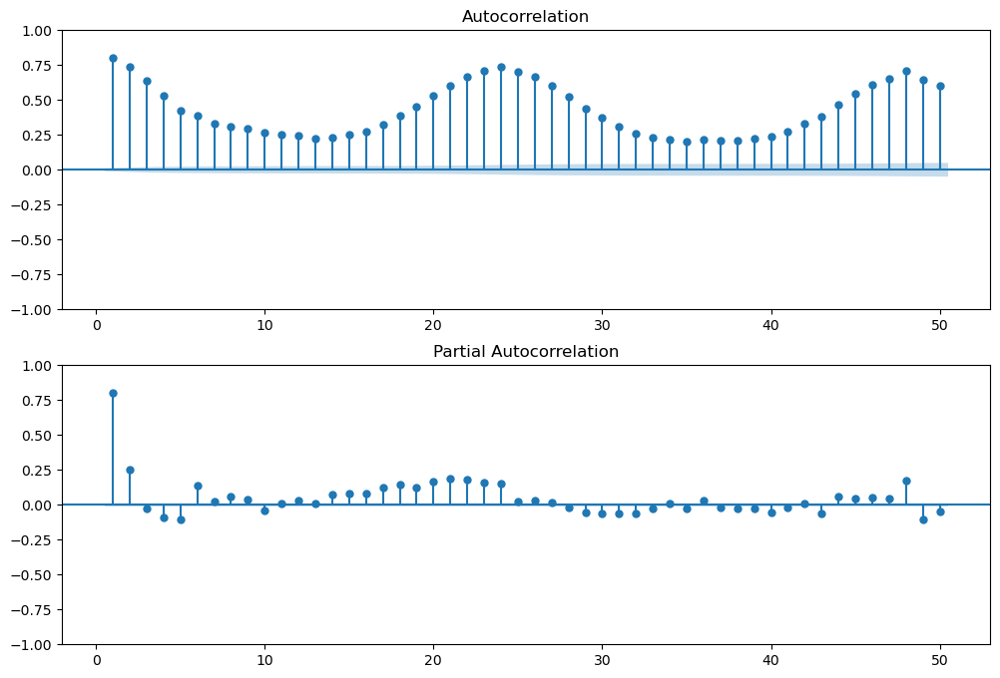

In [85]:
# Create the acf and pacf plots

dfacf = []
dfacf = df_hr['SDGE']
lags = 50

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))

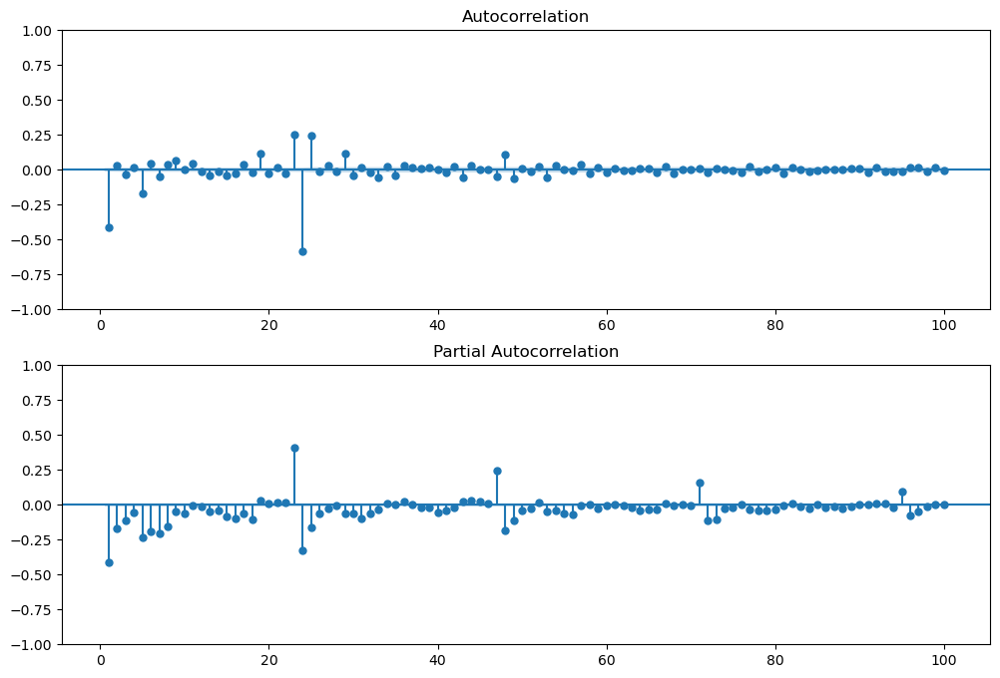

In [86]:
# Differencing the data this time to remove the trend and seasonality
dfacf = []
dfacf = df_hr['SDGE']
dfacf = dfacf.diff().dropna() #Previous hour diff 
dfacf = dfacf.diff(24).dropna() 
dfacf = dfacf.diff(24*365).dropna()# Daily diff our value 24h prior #Yearly diff
lags = 100

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))

### STL Decomposition
In previous notebook we tried the seaonal decomposition from statsmodel and it wasn't able to give us much insight when seen from a yearly prespective on seasonal fluctuation of the energy market. Here we're trying to use the STL decomposition, with a weekly period.

#### Interpretation
Now, we are pretty confident that the hourly electricity demand time series consists of three main components: A (yearly) trend that reaches bottom in July, a complex seasonality component (with multiple other seasonality sub-components), and holiday effects.

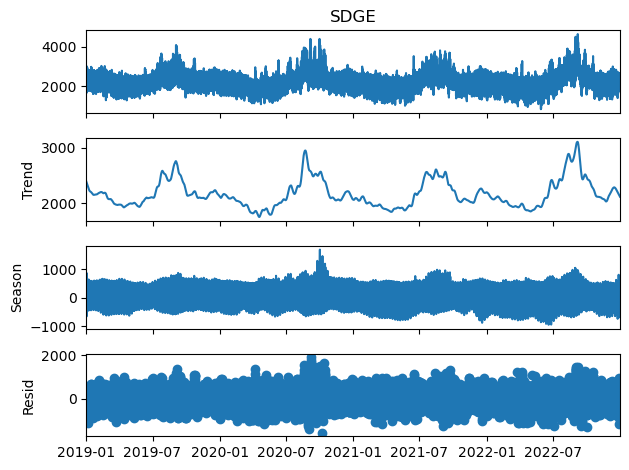

In [87]:
stl = STL(df_hr.SDGE,period=24*7,robust=True)
res = stl.fit()
fig = res.plot()

# Time Series Modeling
## SARIMAX
Our SARIMAX model performed relatively well for a complex seasonality. with MAPE of 17.04%. The model has a mean absolute error (MAE) of 356.89 MWH. A lower MAE and MSE indicate better accuracy of the model in predicting the values. 356.89 MAE MWH is higher than our baseline model, since there's complex seasonal pattern in our data SARIMAX could having a hard time picking on seasonal trends. 

There's a solution for this and this [blog](https://medium.com/intive-developers/forecasting-time-series-with-multiple-seasonalities-using-tbats-in-python-398a00ac0e8a) goes in detail on forcasting timeseries with multiple seasoinality, because the other models mentioned are computationally expensive, we'll try the Fourier transformation method and engineer some features to help with seasonality modeling next.


In [88]:
#Sarima parameters step serching to find a combination with minimum AIC

# p_values = range(0, 4)  # range of p values 
# d_values = range(0, 4)  # range of d values 
# q_values = range(0, 4)  # range of q values 
# P_values = range(0, 4)  # range of seasonal P values 
# D_values = range(0, 4)  # range of seasonal D values 
# Q_values = range(0, 4)  # range of seasonal Q values 
# m = 24  # seasonal period 

# model = auto_arima(train_df, start_p=0, start_q=0,
#                    max_p=4, max_q=4, m=24,
#                    start_P=0, seasonal=True,
#                    d=1, D=1, trace=True,
#                    error_action='ignore', 
#                    suppress_warnings=True,
#                    stepwise=True) 
##Results 
#order=(2,1,1) 
#seasonal_order=(1, 0, 1, 24)

In [127]:
# These were chosen from the above auto_arima search and chose the combination with the lowest AIC
sari_mod =SARIMAX(train_ts,
                  order=(2, 1, 1),
                  seasonal_order=(1, 0, 1, 24),
                  enforce_stationarity=False,
                  enforce_invertibility=False).fit()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            6     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.22731D+00    |proj g|=  9.43040D-01


 This problem is unconstrained.



At iterate    5    f=  6.93310D+00    |proj g|=  4.66613D-01

At iterate   10    f=  6.91836D+00    |proj g|=  5.09008D-01

At iterate   15    f=  6.91554D+00    |proj g|=  2.01109D-01

At iterate   20    f=  6.89765D+00    |proj g|=  9.09326D-01

At iterate   25    f=  6.85273D+00    |proj g|=  7.56697D-01

At iterate   30    f=  6.83658D+00    |proj g|=  8.89851D-01

At iterate   35    f=  6.83544D+00    |proj g|=  1.37672D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    6     35     92      1     0     0   1.377D-01   6.835D+00
  F =   6.8354377603815166     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


In [128]:
predictions = sari_mod.forecast(steps=len(test_ts)) 

In [129]:
# Calculate the errors 
y_true_sr = test_ts['SDGE'] 
y_pred_sr = predictions
error_metrics(y_true_sr, y_pred_sr) 

Mean Absolute Error: 356.89
Mean Squared Error: 212132.25
Root Mean Squared Error: 460.58
Mean Absolute Percentage Error: 17.04%
Variance Score: 0.19


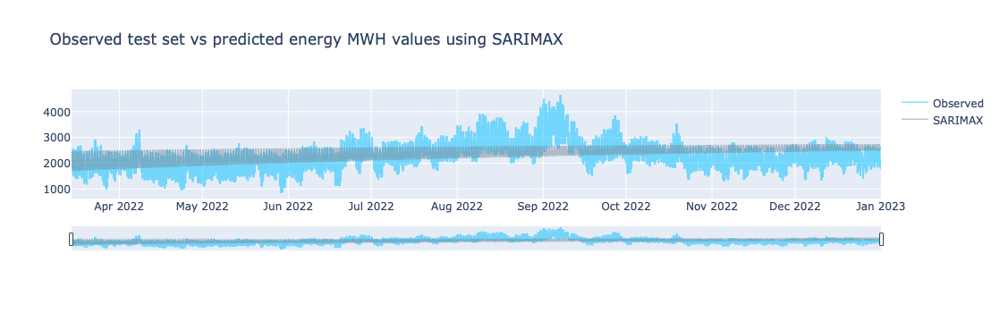

In [130]:
plot_ts_pred(y_true_sr, y_pred_sr, model_name='SARIMAX', og_ts_opacity = 0.5, pred_ts_opacity = 0.5)

# SARIMAX with Weather Variables

## Fourier Transformation

In a SARIMAX model, the Fourier transformation can be applied to capture and model the seasonal patterns of data. It is a mathematical technique used to decompose a time series into its constituent frequencies.

The Fourier transformation works by representing a time series as a sum of sine and cosine waves of different frequencies. These frequencies correspond to the different seasonal components present in the data, such as daily, weekly, or yearly patterns. By decomposing the time series into its frequency components, the Fourier transformation allows us to isolate and model the seasonal patterns separately.

We're using the Fourier Transformation to create additional exogenous variables that capture the seasonal patterns. These variables can improve the accuracy of the forecasts and capture the seasonal variations more effectively.

In [409]:
sdge = pd.read_csv('SDGE_W.csv')

In [410]:
sdge = sdge.drop('Unnamed: 0', axis=1)
sdge.set_index("Date", inplace =True)
sdge.index = pd.to_datetime(sdge.index)

In [411]:
sdge = sdge.drop(['season', 'weekday', 'month', 'year', 'hour', 'day'], axis=1)

In [412]:
# Create a new DataFrame with Fourier terms as exogenous variables 
exog = pd.DataFrame(index=sdge.index) 
exog['SDGE'] = sdge['SDGE']

In [413]:
# Create Fourier terms for weekly seasonality 
weekly_periods = 7 
for i in range(1, weekly_periods + 1):    
    exog[f'weekly_sin_{i}'] = np.sin(2 * np.pi * i * sdge.index.dayofweek / weekly_periods)     
    exog[f'weekly_cos_{i}'] = np.cos(2 * np.pi * i * sdge.index.dayofweek / weekly_periods)  
    # Create Fourier terms for yearly seasonality 
yearly_periods = 365
for i in range(1, yearly_periods + 1):     
    exog[f'yearly_sin_{i}'] = np.sin(2 * np.pi * i * sdge.index.dayofyear / yearly_periods)     
    exog[f'yearly_cos_{i}'] = np.cos(2 * np.pi * i * sdge.index.dayofyear / yearly_periods)  
    # Create Fourier terms for hourly seasonality 
hourly_periods = 24 
for i in range(1, hourly_periods + 1):     
    exog[f'hourly_sin_{i}'] = np.sin(2 * np.pi * i * sdge.index.hour / hourly_periods)     
    exog[f'hourly_cos_{i}'] = np.cos(2 * np.pi * i * sdge.index.hour / hourly_periods)  

In [414]:
exog_train ,exog_test = train_val_test_split(exog, validation=False)

In [415]:
X_train_fr = exog_train.drop('SDGE', axis= 1)
y_train_fr = exog_train.SDGE.values.reshape(-1,1)
X_test_fr = exog_test.drop('SDGE', axis= 1)
y_test_fr = exog_test.SDGE.values

In [416]:
 # Fit a SARIMAX model with exogenous variables 
sari_fr = SARIMAX(endog=y_train_fr, 
                exog=exog_train, 
                  order=(2, 1, 1), 
                seasonal_order=(1, 0, 1, 24)) 

In [417]:
model_fit = sari_fr.fit(n_jobs=-1) 

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          799     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.05932D+01    |proj g|=  3.17836D+09


 This problem is unconstrained.


KeyboardInterrupt: 

In [ ]:
 results.summary()

In [310]:
# Forecast using the SARIMAX model with exogenous variables 
forecast = model_fit.get_forecast(steps=len(y_test_fr), 
                                  exog=X_test_fr) 

In [317]:
forcasted_fr = forecast.predicted_mean 
forcasted_fr.shape

(7014,)

In [316]:
y_true_fr = exog_test.SDGE
y_true_fr.shape

(7014,)

In [318]:
error_metrics(y_true_fr,  forcasted_fr) 

Mean Absolute Error: 0.00
Mean Squared Error: 0.00
Root Mean Squared Error: 0.00
Mean Absolute Percentage Error: 10.38%
Variance Score: 1.00


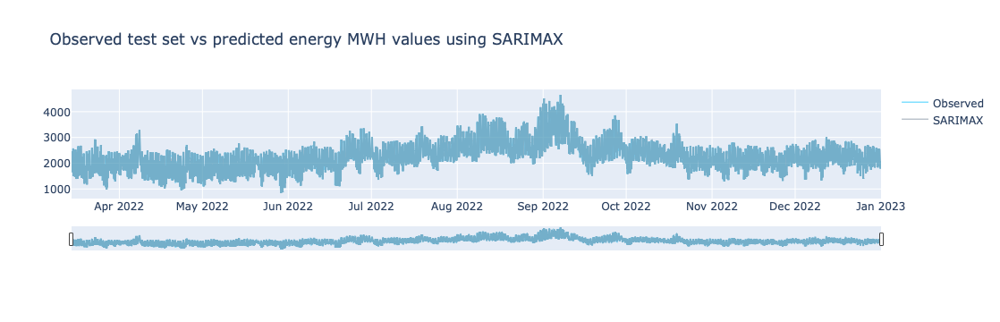

In [319]:
plot_ts_pred(y_true_fr, forcasted_fr, model_name='SARIMAX', og_ts_opacity = 0.5, pred_ts_opacity = 0.5)

In [ ]:
df_fr = df.copy

In [398]:
def add_fourier_terms(df, year_k, week_k, day_k):
    """
    df: dataframe to add the fourier terms to 
    year_k: the number of Fourier terms the year period should have. Thus the model will be fit on 2*year_k terms (1 term for 
    sine and 1 for cosine)
    week_k: same as year_k but for weekly periods
    day_k:same as year_k but for daily periods
    """
    
    for k in range(1, year_k+1):
        # year has a period of 365.25 including the leap year
        df['year_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.dayofyear/365.25) 
        df['year_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.dayofyear/365.25)

    # for k in range (1, month_k+1):
    #     df['month_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.month/12)      
    #     df['month_cos'+str(k)] = np.cos(2 *k* np.pi *  df.index.month/12)

    for k in range(1, week_k+1):
        
        # week has a period of 7
        df['week_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.dayofweek/7)
        df['week_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.dayofweek/7)


    for k in range(1, day_k+1):
        
        # day has period of 24
        df['hour_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.hour/24)
        df['hour_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.hour/24) 

In [399]:
add_fourier_terms(df_fr, year_k= 5, week_k=5, day_k=5)

In [246]:
# Error using 2 as k
# Mean Absolute Error: 3615.08
# Mean Squared Error: 20400930.07
# Root Mean Squared Error: 4516.74
# Mean Absolute Percentage Error: 159.57%
# Variance Score: -77.38

In [401]:
# Choosing a subset of the above dataframe, since we've created fourier transformed variables from our time index
df_fr = df_fr.drop(['season', 'weekday', 'month', 'year', 'hour', 'day'], axis=1)

In [402]:
train_fr ,test_fr = train_val_test_split(df_fr, validation=False)

In [403]:
X_train_fr = train_fr.drop('SDGE', axis= 1)
y_train_fr = train_fr.SDGE.values.reshape(-1,1)
X_test_fr = test_fr.drop('SDGE', axis= 1)
y_test_fr = test_fr.SDGE.values

In [404]:
scaler = StandardScaler()

In [405]:
X_train_processed = scaler.fit_transform(X_train_fr)
X_test_processed = scaler.transform(X_test_fr)

In [406]:
sari_fr =SARIMAX(y_train_fr,
                  order=(2, 1, 1),
                  seasonal_order=(1, 0, 1, 24),
                  enforce_stationarity=False,
                  enforce_invertibility=False,
                exog = X_train_processed).fit(n_jobs=-1)

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           44     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.84575D+00    |proj g|=  2.53834D+00
  ys=-6.450E-01  -gs= 5.608E+00 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   44      2     32      2     1     0   2.837D+00   6.840D+00
  F =   6.8396764954246274     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


In [261]:
y_pred_fr = sari_fr.predict(start=len(y_train_fr), end=len(y_train_fr)+len(y_test_fr)-1, exog=X_test_processed) 

In [274]:
y_pred_fr = sari_fr.predict(start=len(y_train_fr), end=len(y_train_fr)+len(y_test_fr)-1, exog=X_test_processed) 

In [275]:
# Calculate the errors 
error_metrics(y_test_fr,  y_pred_fr) 

Mean Absolute Error: 3615.08
Mean Squared Error: 20400930.07
Root Mean Squared Error: 4516.74
Mean Absolute Percentage Error: 159.57%
Variance Score: -77.38


# Linear Models
Linear regression models can be used to predict hourly energy consumption by incorporating feature engineered lags. We can create lag variables by shifting the original weather data by a certain number of hours.

To predict hourly energy consumption using 24-hour lags, we would create 24 lag variables for each historical hourly consumption

Once we have created the lag variables, we can use them as input features in a linear regression model. The model will learn the relationship between the lagged features and the target variable (hourly consumption) based on the training data. The coefficients of the lag variables in the linear regression equation will indicate the impact of each lagged feature on the predicted energy consumption.

When making predictions for future hours, we would use the lagged weather features from the previous day as inputs to the model. For example, if we want to predict the weather at 2 PM today, we would use the lagged weather features from 2 PM to 2 PM of the previous day as inputs to the model.

In [ ]:
df_lr = pd.read_csv('SDGE_W.csv')

In [ ]:
df_lag = df.copy()

In [ ]:
# Creating the lag variables
for i in range(24):
    df_lag['lag'+str(i+1)] = df_lag['SDGE'].shift(i+1)

In [ ]:
# Since the first 24 values won't have any 24th lag, they will be null values, therefore dropping them
df_lag = df_lag.dropna()

In [ ]:
df_lag = df_lad.drop(['day'], axis=1)

In [ ]:
train_lag, test_lag = train_val_test_split(df_lag, validation=False)

In [ ]:
cv = TimeSeriesSplit(n_splits=5)

In [ ]:
X_train_lag = train_lag.drop('SDGE', axis = 1)
y_train_lag = train_lag.SDGE
X_test_lag = test_lag.drop('SDGE', axis = 1)
y_test_lag = test_lag.SDGE

In [ ]:
param_rf = {     
        'n_estimators': [10, 50, 70, 100, 120, 140, 170, 200],     
        'max_depth': [2, 3, 4, 5, 7, 9, 10],
        'max_features' : ['auto', 'sqrt'],
        'min_samples_split': [2, 5, 7, 10] }  

In [ ]:
#Create pipeline
RandomForest = Pipeline([     
    ('processes', processes),     
    ('rf', RandomForestRegressor()) 
]) 

In [ ]:
rflag = GridSearchCV(estimator = RandomForest, param = param_rf, 
                               cv = cv, verbose=2, random_state = 42, n_jobs = -1)

In [ ]:
rflag.fit(X_train, y_train)

In [ ]:
best_rf_params = grid_search.best_params_
rf_model = grid_search.best_estimator_

In [ ]:
y_pred_rf = rf_model.predict(X_test_lag)

In [ ]:
error_metrics(y_test_lag,  y_pred_rf) 

In [ ]:
plot_ts_pred(y_true_sr, y_pred_sr, model_name='SARIMAX', og_ts_opacity = 0.5, pred_ts_opacity = 0.5)

# Regularized Linear Regression

Since we're using laggs to model, our data is highly multicolinear
Ridge, Lasso or Elastic net are great models that can deal with such data:
 
Ridge regression is a regularized linear regression model that adds a penalty term to the loss function to shrink the coefficients towards zero, reducing the impact of highly correlated features. This is effective with a large number of lagged features to avoid overfitting.

Lasso regression is another regularized linear regression model that can handle multicollinearity. The penalty term encourages sparsity in the coefficients, effectively selecting a subset of the lagged features. Lasso regression is usefull to identify the most important lagged features for predicting the target variable.

Elastic net regression is a combination of ridge and lasso regression that balances between the two regularization techniques. It adds both L1 and L2 penalties to the loss function, allowing for both feature selection and coefficient shrinkage. Elastic net regression is effective to balance between selecting important lagged features and reducing multicollinearity.

We'll try Elastic net regression with our lagged data for hourly prediction and see how it performs.

In [ ]:
elastic_net_lag = ElasticNet(l1_ratio = 1, alpha=0.2)
elastic_net_lag.fit(X_train_lag, y_train_lag)

In [ ]:
ElasticNet(alpha=0.2, copy_X=True, fit_intercept=True, l1_ratio=1,
           max_iter=1000, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

# FB Prophet
Prophet is a time series forecasting library developed by Facebook. It is designed to provide accurate and intuitive forecasts for time series data with various trends and seasonal patterns. Prophet uses a decomposable model that consists of three main components: trend, seasonality, and holidays. The trend component captures the long-term growth or decline in the data, while the seasonality component captures recurring patterns such as daily, weekly, or yearly seasonality. The holiday component allows for the inclusion of specific events or holidays that may impact the data. 

Prophet uses a Bayesian approach to fit the model to the data, allowing for uncertainty estimation and the incorporation of prior knowledge. 
We'll first try prophet model without any betterment and add information based on resuts.

In [331]:
# Facebook Prophet
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.plot import add_changepoints_to_plot, plot_cross_validation_metric, plot_seasonality
import prophet.plot

In [332]:
# !pip install prophet

In [351]:
sdge_fb = pd.read_csv('SDGE_W.csv')

In [352]:
sdge_fb = sdge_fb[["Date", "SDGE"]]

In [354]:
sdge_fb.rename(columns={'Date':'ds','SDGE':'y'}, inplace =True)

In [382]:
sdge_fb.head()

,ds,y
0,2019-01-01 00:00:00,2372.497411
1,2019-01-01 01:00:00,2698.751137
2,2019-01-01 02:00:00,2777.672120
3,2019-01-01 03:00:00,2799.193829
4,2019-01-01 04:00:00,2761.883322


In [356]:
train_fb, test_fb = train_val_test_split(sdge_fb, validation=False)

In [358]:
prophet = Prophet(interval_width=0.95)  # for each estimate, return a 95% interval
prophet.fit(train_fb)      

20:49:02 - cmdstanpy - INFO - Chain [1] start processing
20:49:05 - cmdstanpy - INFO - Chain [1] done processing


In [359]:
future = prophet.make_future_dataframe(periods=len(test_fb), freq='H')
forecast = prophet.predict(future)

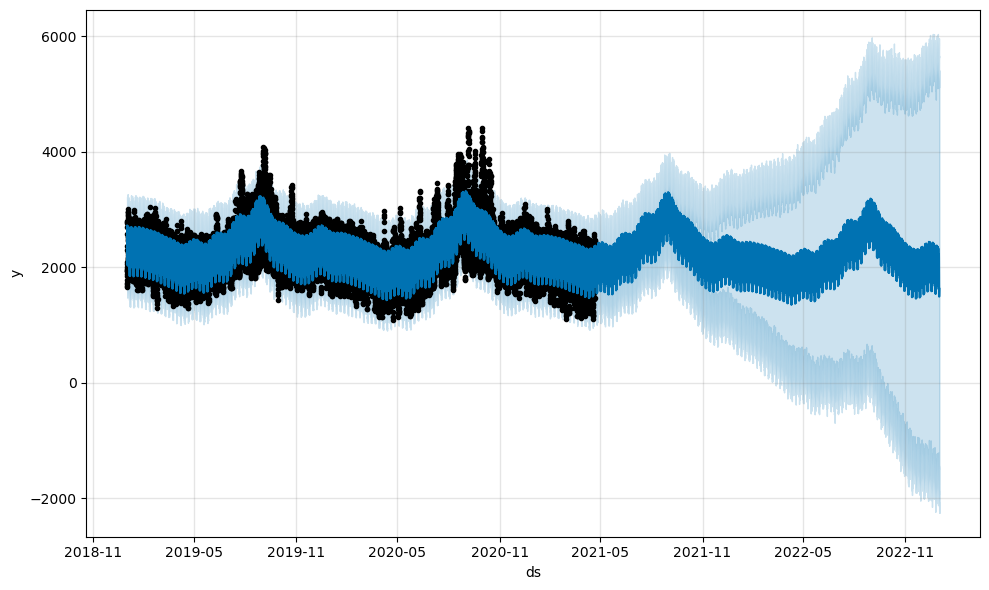

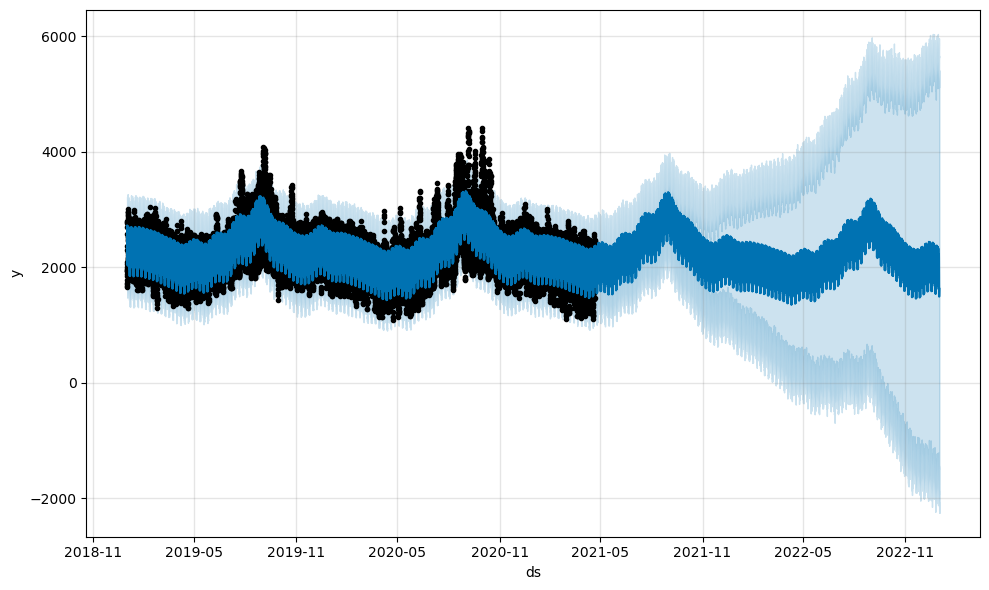

In [386]:
prophet.plot(forecast) 

In [ ]:
prophet.plot_components(forecast)

In [395]:
y = sdge_fb['y'] 
yhat = forecast['yhat'].tail(len(actual_values)) 

In [396]:
error_metrics(y, yhat) 

Mean Absolute Error: 222.57
Mean Squared Error: 87769.68
Root Mean Squared Error: 296.26
Mean Absolute Percentage Error: 10.22%
Variance Score: 0.55


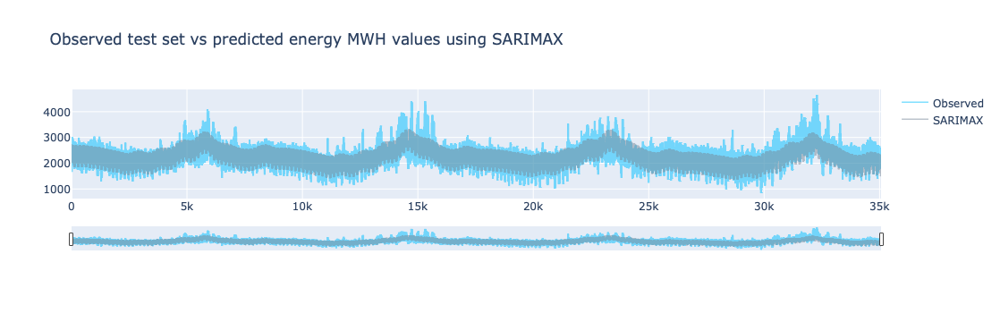

In [397]:
plot_ts_pred(y, yhat, model_name='SARIMAX', og_ts_opacity = 0.5, pred_ts_opacity = 0.5)

### Interpretation
Late summer and early autumn are typically the hottest times of the year in sandiego, which prophet seems to capture, weekdays are also prone to more consumption as work hours, the yearly trend in consuption has relatively been constant but we're interested in predicting hourly consumption and we'll skip this for now. 
Hourly consumption doesn't seem to make sense, as consumption is generally higher during day than past midnight, we'll include weather data, and feature engeneer hours to morning, afternoon, evening and night to see if model pick on those.  
From the error metrics we can see that the model perfoms much better than our baseline model even without any additional information. The predicted energy consumption is on avegage 296.26 MWH off from the actual value, which is a mean error of 10.22%. 

# LSTM 

In [ ]:
# model = Sequential() 
# model.add(LSTM(100, input_shape=(timesteps, features)))  
# # Add LSTM layer with 100 units 
# model.add(Dense(1))  # Add a dense layer with 1 unit  # Compile the model 
# model.compile(optimizer='adam', loss='mse')  # Train the model 
# model.fit(X_train, y_train, epochs=10, batch_size=32) 
